In [17]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn import preprocessing
import seaborn as sns

In [18]:
df=pd.read_csv("College.csv")
df

,Unnamed: 0,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,Worcester State College,No,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40
773,Xavier University,Yes,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83
774,Xavier University of Louisiana,Yes,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49
775,Yale University,Yes,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99


In [19]:
df.isnull().sum()


Unnamed: 0     0
Private        0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64

In [20]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   777 non-null    object 
 1   Private      777 non-null    object 
 2   Apps         777 non-null    int64  
 3   Accept       777 non-null    int64  
 4   Enroll       777 non-null    int64  
 5   Top10perc    777 non-null    int64  
 6   Top25perc    777 non-null    int64  
 7   F.Undergrad  777 non-null    int64  
 8   P.Undergrad  777 non-null    int64  
 9   Outstate     777 non-null    int64  
 10  Room.Board   777 non-null    int64  
 11  Books        777 non-null    int64  
 12  Personal     777 non-null    int64  
 13  PhD          777 non-null    int64  
 14  Terminal     777 non-null    int64  
 15  S.F.Ratio    777 non-null    float64
 16  perc.alumni  777 non-null    int64  
 17  Expend       777 non-null    int64  
 18  Grad.Rate    777 non-null    int64  
dtypes: float

In [21]:

features = df.drop(['Private', 'Unnamed: 0'],axis=1)
features

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40
773,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83
774,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49
775,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99


In [22]:
features['Acceptperc'] = features['Accept'] / features['Apps']
features['Enrollperc'] = features['Enroll'] / features['Accept']
features

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Acceptperc,Enrollperc
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0.742169,0.585227
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0.880146,0.266112
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0.768207,0.306290
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0.836930,0.392550
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0.756477,0.376712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40,0.689577,0.358416
773,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83,0.921388,0.385042
774,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49,0.913209,0.362924
775,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99,0.229145,0.536894


In [23]:
scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(features)
features_normal

array([[0.03288693, 0.04417701, 0.10791254, ..., 0.46296296, 0.69505955,
        0.53926736],
       [0.04384229, 0.07053089, 0.07503539, ..., 0.42592593, 0.85824758,
        0.18479204],
       [0.0280549 , 0.03903572, 0.04734938, ..., 0.40740741, 0.72585575,
        0.22942163],
       ...,
       [0.04198863, 0.07018813, 0.10382256, ..., 0.36111111, 0.89735157,
        0.29233154],
       [0.22127341, 0.09067713, 0.20166745, ..., 0.82407407, 0.08830011,
        0.48557796],
       [0.06056693, 0.06790312, 0.10319333, ..., 0.82407407, 0.55128923,
        0.30297581]])

In [24]:
pd.DataFrame(features_normal).describe()


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,0.060830,0.074141,0.117189,0.279564,0.514249,0.113030,0.039125,0.418423,0.406294,0.202041,0.166510,0.680634,0.732930,0.310716,0.355373,0.122046,0.513549,0.700688,0.346862
std,0.080607,0.093347,0.146166,0.185688,0.217635,0.153962,0.069724,0.207800,0.172871,0.073576,0.103370,0.171875,0.193715,0.106122,0.193622,0.098437,0.159053,0.173982,0.148836
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.014475,0.020260,0.032563,0.147368,0.351648,0.027076,0.004305,0.257231,0.286412,0.166667,0.091603,0.568421,0.618421,0.241287,0.203125,0.067205,0.398148,0.616384,0.241545
50%,0.030763,0.039531,0.062765,0.231579,0.494505,0.049771,0.016121,0.395145,0.381463,0.180036,0.145038,0.705263,0.763158,0.297587,0.328125,0.097857,0.509259,0.738325,0.319540
75%,0.073793,0.089573,0.136385,0.357895,0.659341,0.122715,0.044241,0.546746,0.515448,0.224599,0.221374,0.810526,0.894737,0.375335,0.484375,0.144099,0.629630,0.820845,0.428683
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


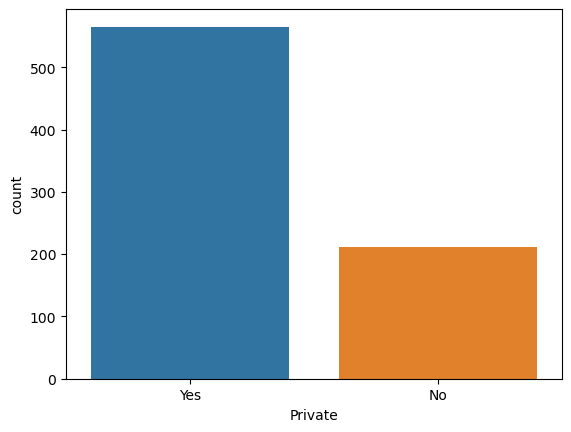

In [25]:
sns.countplot(x = 'Private',data =df)
plt.show()

In [26]:
instution_type = df.groupby('Private')[['Apps','Accept','Enroll','F.Undergrad','P.Undergrad']].sum().reset_index()
instution_type['Expend'] = df.groupby('Private').Expend.mean().reset_index()['Expend']
st = instution_type['Enroll']
instution_type['Student_percentage'] = [st[0]/(st[0]+st[1]),st[1]/(st[0]+st[1])]
instution_type

,Private,Apps,Accept,Enroll,F.Undergrad,P.Undergrad,Expend,Student_percentage
0,No,1214743,830889,347865,1817053,419376,7458.316038,0.573998
1,Yes,1117530,737722,258174,1057775,245191,10486.353982,0.426002


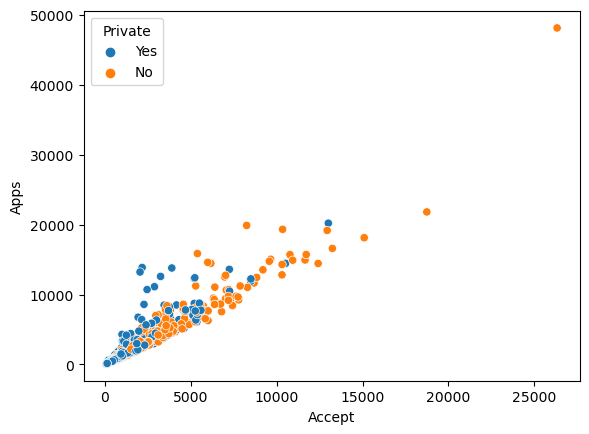

In [27]:
sns.scatterplot(x = 'Accept',y = 'Apps',data = df, hue = 'Private')
plt.show()

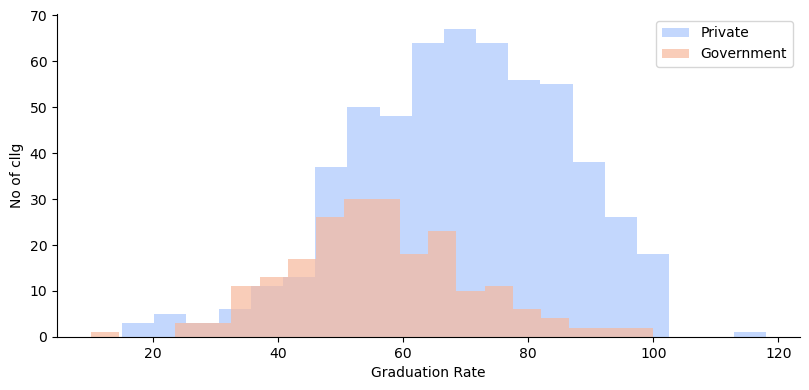

In [28]:
g = sns.FacetGrid(df,hue="Private",palette='coolwarm',height=4,aspect=2)
g = g.map(plt.hist,'Grad.Rate',bins=20,alpha=0.7)
plt.xlabel('Graduation Rate')
plt.ylabel('No of cllg')
plt.legend(['Private','Government'])
plt.show()

(0.0, 100.0)

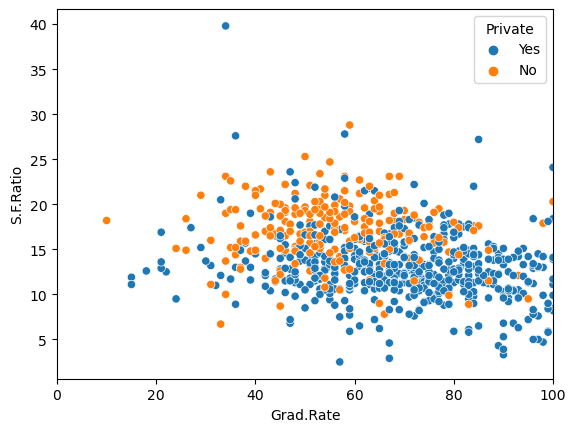

In [29]:
sns.scatterplot(x = 'Grad.Rate', y = 'S.F.Ratio',data= df,hue = 'Private')
plt.xlim(0,100)

In [30]:
from sklearn.cluster import KMeans
inertia = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_normal)
    kmeanModel.fit(features_normal)
    inertia.append(kmeanModel.inertia_)

c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the 

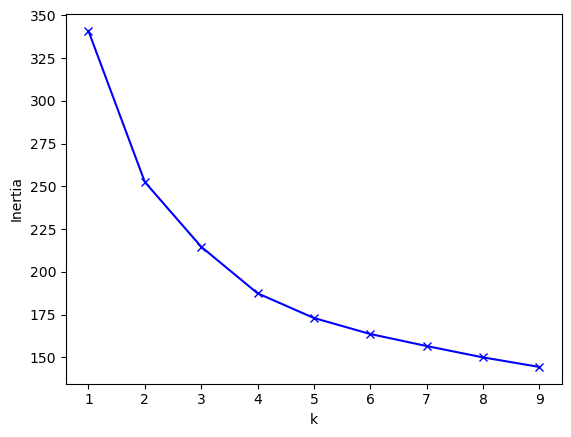

In [31]:
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

In [32]:
kmeans = KMeans(n_clusters=4).fit(features_normal)


c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [33]:
labels = pd.DataFrame(kmeans.labels_) 
labeledColleges = pd.concat((features,labels),axis=1)
labeledColleges = labeledColleges.rename({0:'labels'},axis=1)

In [43]:
labeledColleges.head()


,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Acceptperc,Enrollperc,labels
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0.742169,0.585227,2
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0.880146,0.266112,2
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0.768207,0.306290,2
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0.836930,0.392550,3
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0.756477,0.376712,2


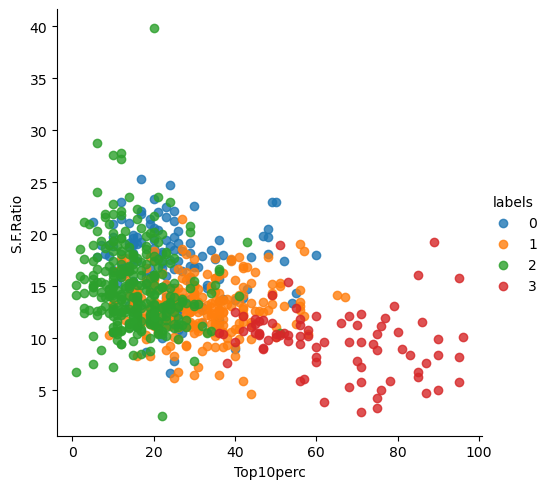

In [44]:
sns.lmplot(x='Top10perc',y='S.F.Ratio',data=labeledColleges,hue='labels',fit_reg=False)


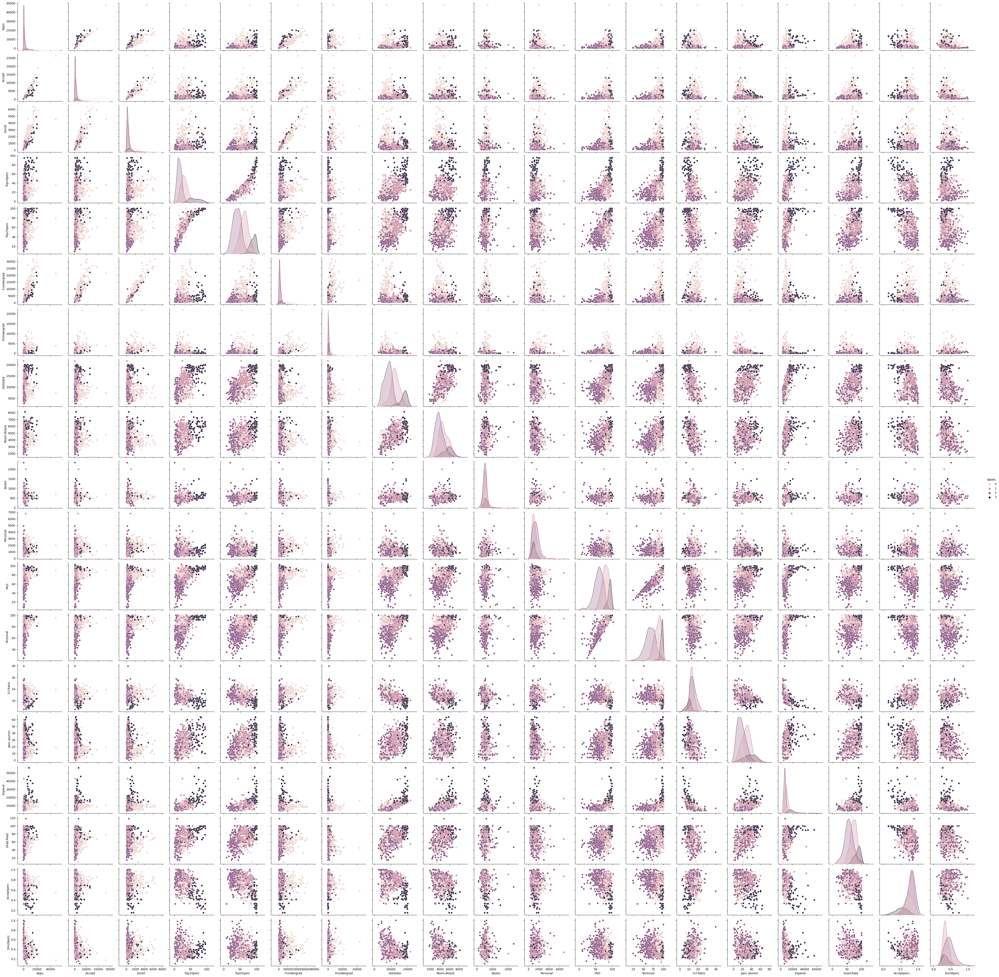

In [45]:
sns.pairplot(labeledColleges,hue='labels')


In [37]:
x = df.drop(['Unnamed: 0','Private','Personal'],axis = 1)
kmean = KMeans(n_clusters= 2)
kmean.fit(x)


c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [39]:
identified_cluster = kmean.fit_predict(x)
df['cluster'] = identified_cluster

c:\Users\Mahdi-e\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


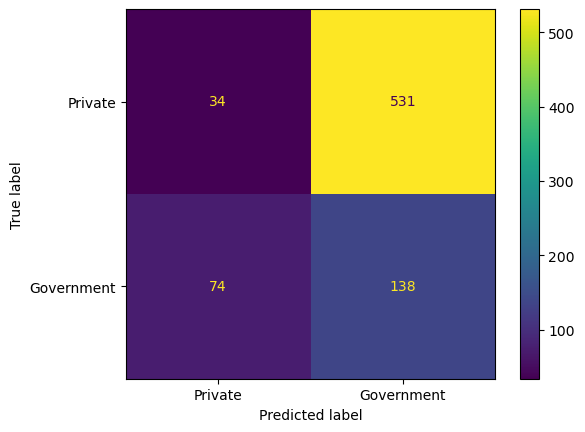

In [41]:
from sklearn import metrics
results = metrics.confusion_matrix(y_true = df['Private'].map({'Yes':0,'No':1}),y_pred = df['cluster'])
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = results,display_labels=['Private','Government'])

cm_display.plot()
plt.show()